# Native Painted Turtles (cpb) 2008-2017
Statistical Analysis of a turtle population "Chysemmys picta belli" at two locations in the pacific north west surveyed between 2008 and 2017


## Data cleaning and new features
### data cleaning and aggregation
 **Species** are recorded to either *Cbp* (native painted turtle) or *Res* (red eared sliders). This analysis only looks at Cbp-Native-Turtles
 
 **Gravid** *True* female turtle carrying eggs
 
 **Sex** *m*, *f* or *unknown*
 
 **Carapace**, **Plastron**, **Weight** cleaned decimals.. only decimals >0 utilized in analysis
 
 **Weight** a value > 0 means recorded survey. Value = 0 means repeat sighting and not relevant for analisis
 
 ### new features
 **new_annuli** it is very hard to count the annuli for older surveys accurately. Different surveyors might come up with different annuli values for the same turtle. Further, it becomes harder the older the turtle gets. Thus for some old turtles, it is impossible to assess the annuli. For that reason, a new feature **new_annuli** is created. We conservatively take the lowest ever counted annuli for an individual turtle and then increment its annuli for each sighting in the following years. Pseudo Code:
> new_annuli = (year_of_sighting - year_of_very_fist_sighting) + lowest_annuli_ever_recorded 

**gender_plus** *m*, *f*, *f_gra*, *unknown* (distinguishes non-gravid  and gravid females

In [1]:
import warnings
warnings.filterwarnings('ignore')

#Prepping the notebook
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
# my custom helper functions
import helpers as hlp
import turtles
import scipy
import pandas as pd
#filter data: Naitive turle and relevant
print ("Filtering Natives ...")
natives = turtles.get_clean_data()
natives = natives[natives['Weight']!=0]
natives = natives[natives['Carapace']!=0]
natives = natives[natives['Plastron']!=0]
natives = natives[natives['Species']=='Cpb']
print ("Done")


Filtering Natives ...
Loading data source/All Site Data oct 2021.xlsx
RamseyLB2021
SB 2021
Gresham
MasonFLO
Whitaker
ElaineSB1999-2001
Cleaning decimals ...
Cleaning other values ...
Add new features ...
Done


## EDA - Exploratory Data Analysis

basic metrics (sanity check that the data loaded correct)

In [2]:
#Show some data - basic metrics
natives[['Carapace','Plastron','Annuli','Weight']].describe()

,Carapace,Plastron,Annuli,Weight
count,1452.000000,1452.000000,1452.000000,1452.000000
mean,145.409622,137.251160,6.288567,499.579987
std,39.522148,38.204201,3.463514,356.363647
min,24.000000,24.000000,0.000000,4.000000
25%,115.007502,107.970003,4.000000,215.000000
50%,142.279999,134.154999,6.000000,374.000000
75%,180.424995,170.000000,8.000000,754.250000
max,237.199997,242.199997,20.000000,1504.000000


In [3]:
#Show some data - Gender, Location etc
natives[['Species','Capture Location','Source','ID']].pivot_table(index=['Capture Location','Source','Species'],aggfunc='count')

,,,ID
Capture Location,Source,Species,
???,All Site Data oct 2021.xlsx|Gresham,Cpb,2
Backyard,All Site Data oct 2021.xlsx|Gresham,Cpb,2
Binford Lake,All Site Data oct 2021.xlsx|Gresham,Cpb,1
Binford Lake/Hollydale Neighborhood,All Site Data oct 2021.xlsx|Gresham,Cpb,1
Bybee Lake,All Site Data oct 2021.xlsx|ElaineSB1999-2001,Cpb,61
...,...,...,...
mason flats center pond,All Site Data oct 2021.xlsx|MasonFLO,Cpb,21
mason flats west pond,All Site Data oct 2021.xlsx|MasonFLO,Cpb,3
middle of west side of center channel,All Site Data oct 2021.xlsx|Gresham,Cpb,1


# Swarmplots 
## Swarmplots to show the distribution of Carapace, Plastron, and Weight by Gender
The following plot shows: the min/max size(weight) for each sex and how much diversity there is in weights in a given population. Most males are under 400g, females peak at 400 and 1000g.

Plotting swarm plot with 1452 samples...


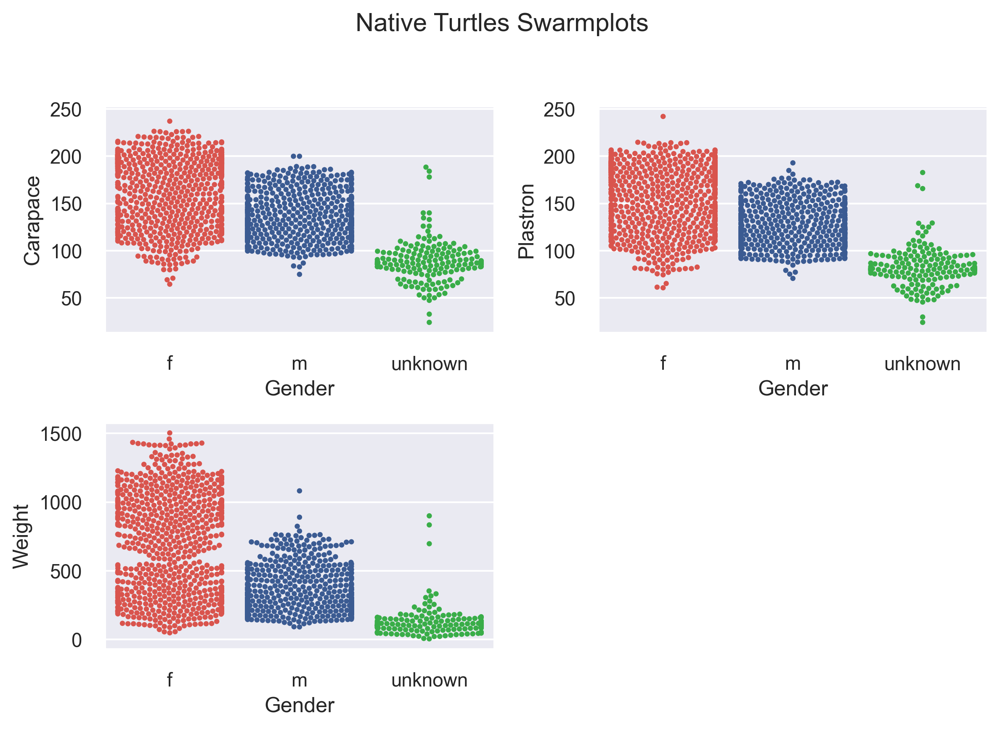

In [4]:
### Basic Swarmplot to show Carapace / Plastron / Weight by Gender
plt.style.use('seaborn-notebook')
plt.rcParams['figure.dpi'] = 300
colors = [sns.xkcd_rgb['pale red'],sns.xkcd_rgb['denim blue'],sns.xkcd_rgb['medium green']]

print ("Plotting swarm plot with " + str(natives.Weight.count()) + ' samples...')
sns.set()
_ = plt.figure(1)
_ = plt.suptitle('Native Turtles Swarmplots ')

_1 =plt.subplot(2,2,1)
_ = sns.swarmplot(x='Gender', y='Carapace', data=natives,size=3,palette=colors)
_ = plt.ylabel('Carapace')

_2 =plt.subplot(2,2,2,sharey=_1)
_ = sns.swarmplot(x='Gender', y='Plastron', data=natives,size=3,palette=colors)
_ = plt.ylabel('Plastron')
_ = plt.tight_layout(rect=[0, 0.03, 1, 0.95])
_ = plt.subplot(2,2,3)
_ = sns.swarmplot(x='Gender', y='Weight', data=natives,size=3,palette=colors)
_ = plt.xlabel('Gender')
_ = plt.ylabel('Weight')

# Weight, Carapace and Plastron distibution by sex
Weight, carapace, and plastron show the same pattern - females ultimately grow larger and heavier than males.  Trapping will show a greater diversity in female sizes/weights than with males. I am curious about the outliers.

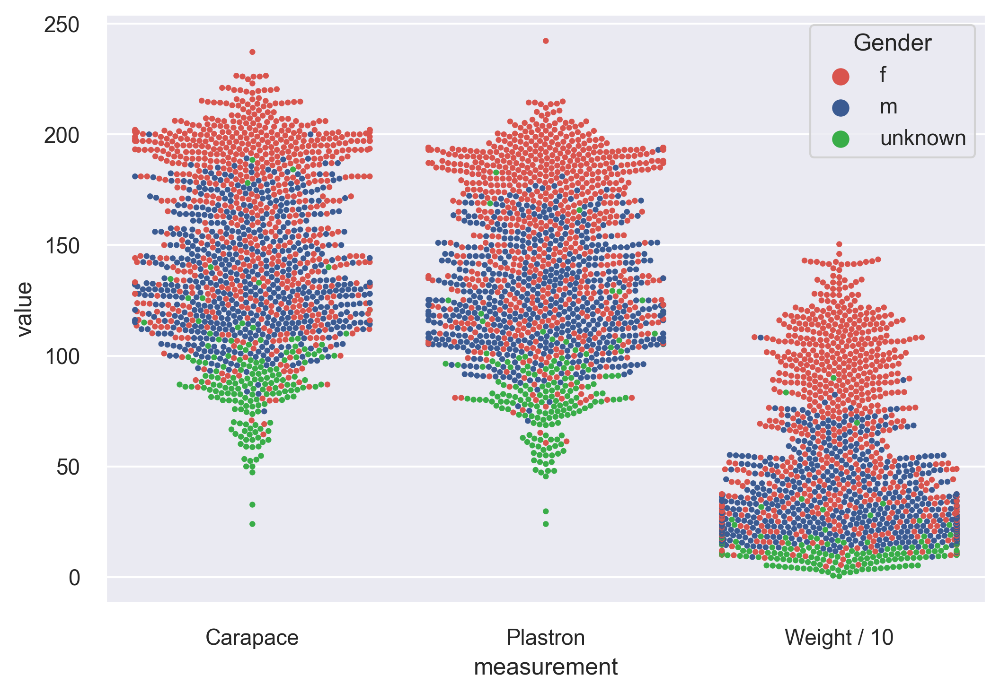

In [5]:
#
natives_melted = natives.copy()
natives_melted['Weight / 10'] = natives_melted.Weight.div(10)
natives_melted = pd.melt(natives_melted[['Carapace','Plastron','Weight / 10','Gender']],'Gender',var_name='measurement')

_ = sns.swarmplot(x="measurement", y="value", hue="Gender", data=natives_melted,palette=colors,size=3)
_ = plt.show()

In [6]:
## Outliers

In [7]:
someColumns = [
    'Date',
    'ID',
    'Capture Location',
    'Gender',
    'date_min',
    'annuli_min',
    'Carapace',
    'Plastron',
    'Weight',
]

display(natives[
    (natives.Plastron <47) |
    (natives.Carapace <47) |
    (natives.Plastron >220) 
][someColumns])

# display(natives_melted[
#     (natives_melted.value <70) &(natives_melted.measurement != 'Weight / 10')])


,Date,ID,Capture Location,Gender,date_min,annuli_min,Carapace,Plastron,Weight
407,2010-06-10,09-09/H9,"FCH grass between islands, center of restorati...",unknown,2010-06-10,1.0,32.740002,29.730000,7.050000
687,2011-08-02,"RM1, LM4",algae mat in center of west side of center cha...,unknown,2011-08-02,2.0,47.310001,45.500000,21.700001
1225,2017-09-29,2076,Mason Flats - Morrow Pond,f,2017-09-29,9.0,237.199997,242.199997,835.000000
1505,2018-05-21,NaN,Whitaker between ponds,unknown,NaT,NaN,24.000000,24.000000,4.000000


# ECDF Graph of size/weight distribution by sex
 Shows the difference in size/weight distributions between sexes; males have a nice bell curve with an even growth rate throughout life; females have two bumps, one at 400g/150mm carapace and plastron and the other at 1000g, and 200mm shell size.

Plotting Cumulative Distribution Function with 1452 samples...


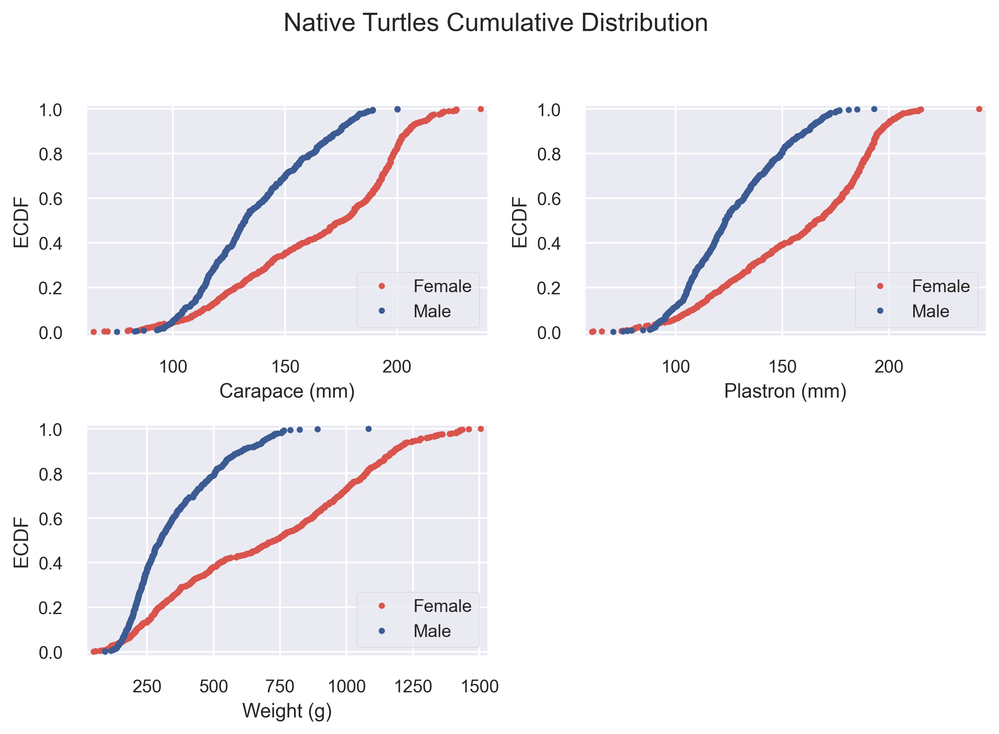

In [8]:
### Same information as beswars above just displayed as ECDFs
plt.style.use('seaborn-notebook')
plt.rcParams['figure.dpi'] = 300
#colors = [sns.xkcd_rgb['pale red'],sns.xkcd_rgb['denim blue']]


print ("Plotting Cumulative Distribution Function with " + str(natives.Weight.count()) + ' samples...')
# Compute ECDFs

_ = plt.figure(2)
_ = plt.suptitle('Native Turtles Cumulative Distribution ')

x_CarapaceF, y_CarapaceF = hlp.ecdf(natives[natives['Gender']=='f']['Carapace'])
x_CarapaceM, y_CarapaceM = hlp.ecdf(natives[natives['Gender']=='m']['Carapace'])

_ = plt.subplot(2,2,1)
_ = plt.plot(x_CarapaceF, y_CarapaceF, marker='.',linestyle = 'none',color=colors[0])
_ = plt.plot(x_CarapaceM, y_CarapaceM, marker='.',linestyle = 'none',color=colors[1])
_ = plt.margins(0.02)
_ = plt.legend(('Female', 'Male'), loc='lower right')
_ = plt.xlabel('Carapace (mm)')
_ = plt.ylabel('ECDF')

x_PlastronF, y_PlastronF = hlp.ecdf(natives[natives['Gender']=='f']['Plastron'])
x_PlastronM, y_PlastronM = hlp.ecdf(natives[natives['Gender']=='m']['Plastron'])

_ = plt.subplot(2,2,2)
_ = plt.plot(x_PlastronF, y_PlastronF, marker='.',linestyle = 'none',color=colors[0])
_ = plt.plot(x_PlastronM, y_PlastronM, marker='.',linestyle = 'none',color=colors[1])
_ = plt.margins(0.02)
_ = plt.legend(('Female', 'Male'), loc='lower right')
_ = plt.xlabel('Plastron (mm)')
_ = plt.ylabel('ECDF')
_ = plt.tight_layout(rect=[0, 0.03, 1, 0.95])

x_WeightF, y_WeightF = hlp.ecdf(natives[natives['Gender']=='f']['Weight'])
x_WeightM, y_WeightM = hlp.ecdf(natives[natives['Gender']=='m']['Weight'])

_ = plt.subplot(2,2,3)
_ = plt.plot(x_WeightF, y_WeightF, marker='.',linestyle = 'none',color=colors[0])
_ = plt.plot(x_WeightM, y_WeightM, marker='.',linestyle = 'none',color=colors[1])
_ = plt.margins(0.02)
_ = plt.legend(('Female', 'Male'), loc='lower right')
_ = plt.xlabel('Weight (g)')
_ = plt.ylabel('ECDF')

# Female size/weight vs age
It shows a similar pattern to the ECDF graphs - females show two distinct "bumps" suggesting two concentrations of female animals in the population.

Plotting Histogram Weight, Carapace and Plastron with 695 samples...


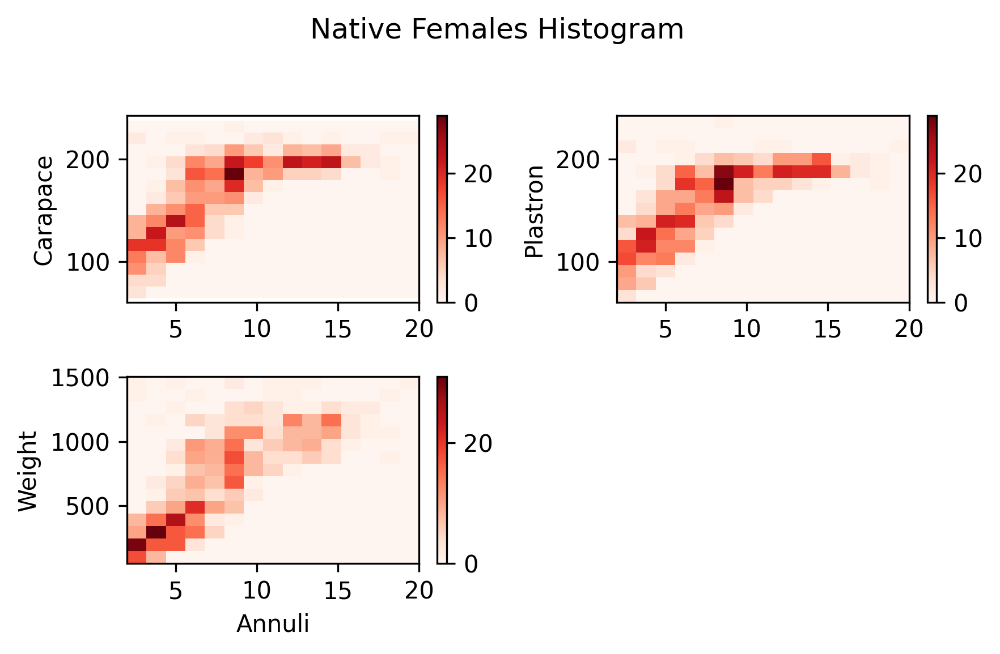

In [9]:
#2d histogram Carapace / Plastron / Weight - Females
sns.reset_orig()
#plt.style.use('seaborn-notebook')
plt.rcParams['figure.dpi'] = 300
## Lineplot Age + Weight, Carapace, Plastron

### FEMALE
females = natives[natives['Gender']=='f']
females = females[females['Annuli']!=0]
print ("Plotting Histogram Weight, Carapace and Plastron with " + str(females.Weight.count()) + ' samples...')

_ = plt.figure(3)
_1 =plt.subplot(2,2,1)

#_ = plt.scatter(females['Annuli'], females['Carapace'])
_ = plt.hist2d(females['Annuli'], females['Carapace'],cmap='Reds',bins=(15,15))
_ = plt.colorbar()
_ = plt.ylabel('Carapace')

_2 =plt.subplot(2,2,2,sharey=_1)
#_ = plt.scatter(females['Annuli'],females['Plastron'])
_ = plt.hist2d(females['Annuli'], females['Plastron'],cmap='Reds',bins=(15,15))
_ = plt.colorbar()
_ = plt.ylabel('Plastron')

_ = plt.suptitle('Native Females Histogram ')
_ = plt.subplot(2,2,3)
#_ = plt.scatter(females['Annuli'], females['Weight'],s=10)
_ = plt.hist2d(females['Annuli'], females['Weight'],cmap='Reds',bins=(15,15))
_ = plt.colorbar()
_ = plt.xlabel('Annuli')
_ = plt.ylabel('Weight')
_ = plt.tight_layout(rect=[0, 0.03, 1, 0.95])

# Males size/weight vs age
Males show one concentration of animals, suggesting a "normal bell curve" distribution.

Plotting Histogram Weight, Carapace and Plastron with 545 samples...


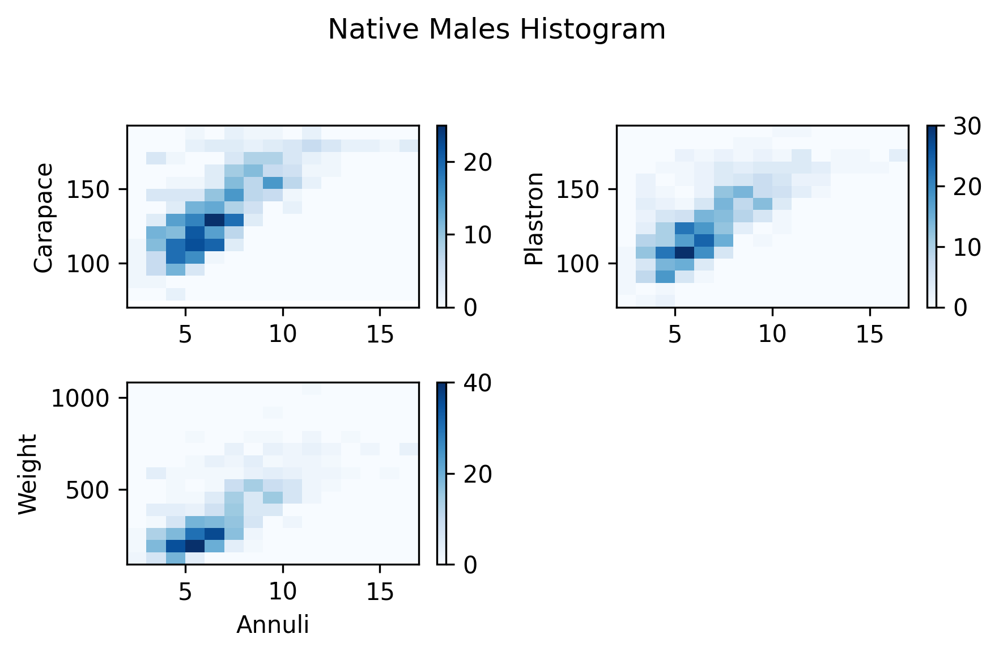

In [10]:
##2d histogram Carapace / Plastron / Weight - Males
sns.reset_orig()
#plt.style.use('seaborn-notebook')
plt.rcParams['figure.dpi'] = 300
## Lineplot Age + Weight, Carapace, Plastron

### MALE
males = natives[natives['Gender']=='m']
males = males[males['Annuli']!=0]
print ("Plotting Histogram Weight, Carapace and Plastron with " + str(males.Weight.count()) + ' samples...')

_ = plt.figure(3)

_1 =plt.subplot(2,2,1)
#_ = plt.scatter(males['Annuli'], males['Carapace'])
_ = plt.hist2d(males['Annuli'], males['Carapace'],cmap='Blues',bins=(15,15))
_ = plt.colorbar()
_ = plt.ylabel('Carapace')

_2 =plt.subplot(2,2,2,sharey=_1)
#_ = plt.scatter(males['Annuli'],males['Plastron'])
_ = plt.hist2d(males['Annuli'], males['Plastron'],cmap='Blues',bins=(15,15))
_ = plt.colorbar()
_ = plt.ylabel('Plastron')

_ = plt.suptitle('Native Males Histogram ')
_ = plt.subplot(2,2,3)
#_ = plt.scatter(males['Annuli'], males['Weight'],s=10)
_ = plt.hist2d(males['Annuli'], males['Weight'],cmap='Blues',bins=(15,15))
_ = plt.colorbar()
_ = plt.xlabel('Annuli')
_ = plt.ylabel('Weight')
_ = plt.tight_layout(rect=[0, 0.03, 1, 0.95])

# Weight distributions across 2 separate populations
The hypothesis: same distribution in all capture locations proved true

In [11]:
#Hyposis: same distribution in all capture locations
native_portland = natives[(natives['Source']=='All Site Data oct 2021.xlsx|MasonFLO')]
native_gresham = natives[(natives['Source']=='All Site Data oct 2021.xlsx|Gresham') ]

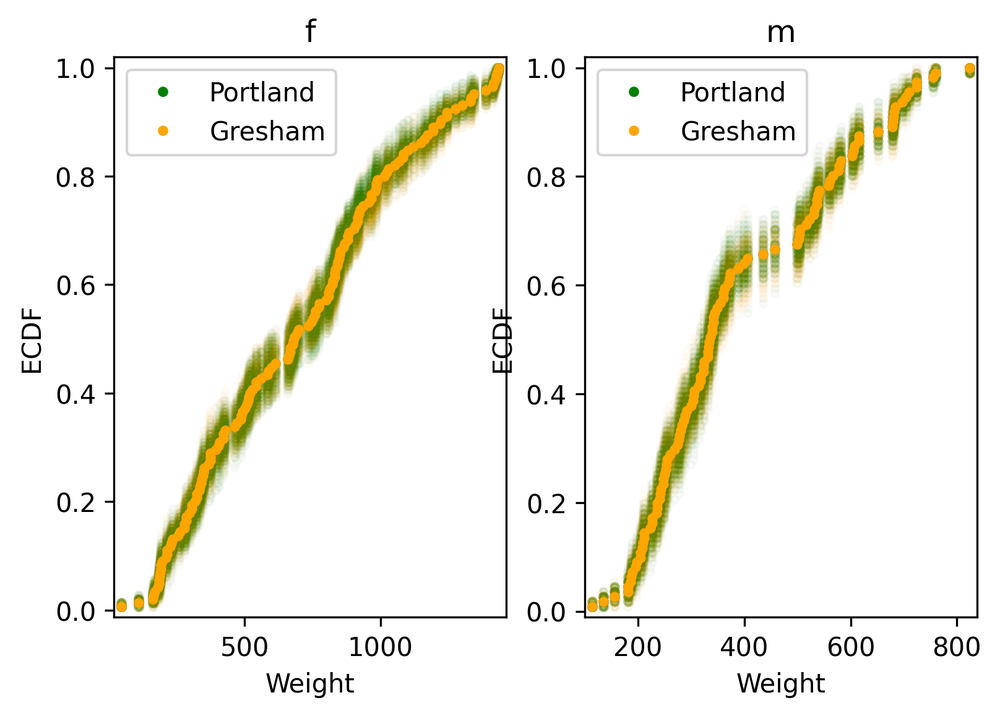

In [12]:
#&(natives['Gender']=='f')
genders = ['f','m']
dimension = 'Weight'
_ = plt.figure(6)
i = 0
for gender in genders:
    i += 1
    _ = plt.subplot(1,2,i)
    for _ in range(100):
        # Generate permutation samples
        native_portland_gender = native_portland[native_portland['Gender']==gender]
        native_gresham_gender = native_portland[native_portland['Gender']==gender]
        perm_sample_1, perm_sample_2 = hlp.permutation_sample(native_portland_gender[dimension],native_gresham_gender[dimension])

        # Compute ECDFs
        x_1, y_1 = hlp.ecdf(perm_sample_1)
        x_2, y_2 = hlp.ecdf(perm_sample_2)

        # Plot ECDFs of permutation sample
        _ = plt.plot(x_1, y_1, marker='.', linestyle='none',
                     color='green', alpha=0.02)
        _ = plt.plot(x_2, y_2, marker='.', linestyle='none',
                     color='orange', alpha=0.02)

    # Create and plot ECDFs from original data
    x_1, y_1 = hlp.ecdf(native_portland_gender[dimension])
    x_2, y_2 = hlp.ecdf(native_portland_gender[dimension])
    _ = plt.plot(x_1, y_1, marker='.', linestyle='none', color='green',label='Portland')
    _ = plt.plot(x_2, y_2, marker='.', linestyle='none', color='orange',label='Gresham')
    _ = plt.legend()
    _ = plt.title(gender)
    # Label axes, set margin, and show plot
    plt.margins(0.02)
    _ = plt.xlabel(dimension)
    _ = plt.ylabel('ECDF')
plt.show()

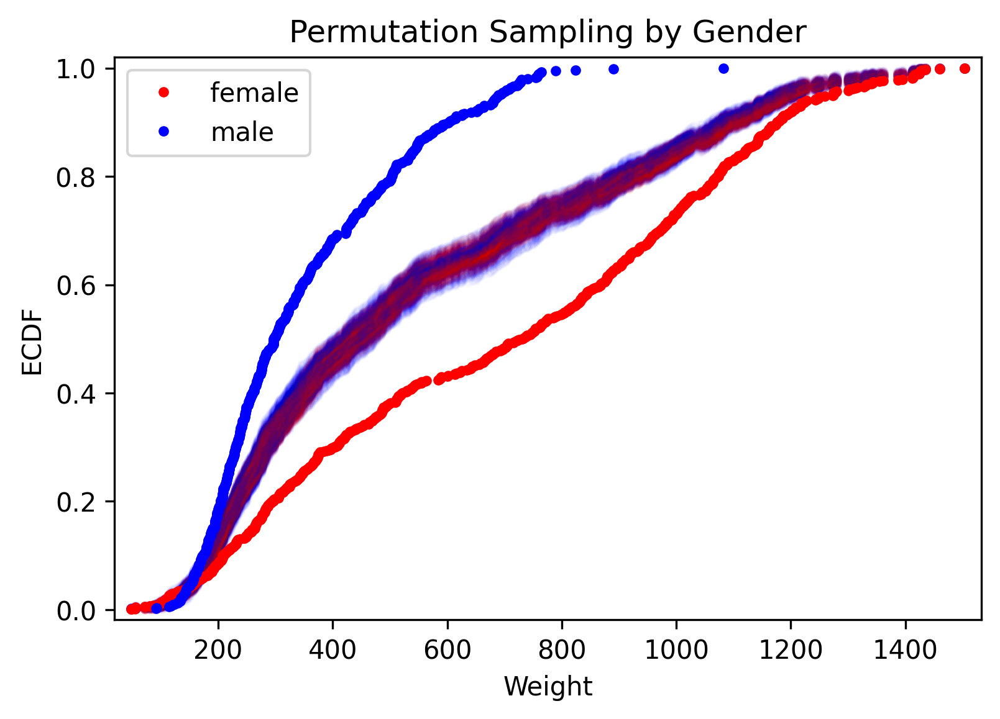

In [13]:
#Hyposis: DIFFERENT distribution between genders
native_females = natives[(natives['Gender']=='f')]
native_males = natives[(natives['Gender']=='m')]
#&(natives['Gender']=='f')
dimension = 'Weight'
_ = plt.figure(7)
for _ in range(100):
    # Generate permutation samples
    perm_sample_1, perm_sample_2 = hlp.permutation_sample(native_females[dimension],native_males[dimension])

    # Compute ECDFs
    x_1, y_1 = hlp.ecdf(perm_sample_1)
    x_2, y_2 = hlp.ecdf(perm_sample_2)

    # Plot ECDFs of permutation sample
    _ = plt.plot(x_1, y_1, marker='.', linestyle='none',
                 color='red', alpha=0.02)
    _ = plt.plot(x_2, y_2, marker='.', linestyle='none',
                 color='blue', alpha=0.02)

# Create and plot ECDFs from original data
x_1, y_1 = hlp.ecdf(native_females[dimension])
x_2, y_2 = hlp.ecdf(native_males[dimension])
_ = plt.plot(x_1, y_1, marker='.', linestyle='none', color='red',label='female')
_ = plt.plot(x_2, y_2, marker='.', linestyle='none', color='blue',label='male')
_ = plt.legend()
_ = plt.title('Permutation Sampling by Gender')
# Label axes, set margin, and show plot
plt.margins(0.02)
_ = plt.xlabel(dimension)
_ = plt.ylabel('ECDF')
plt.show()



# Correlations between annuli, size and weight.
Annuli is less of a predictor of an animals size/weight, however, size and weight are strongly correlated.

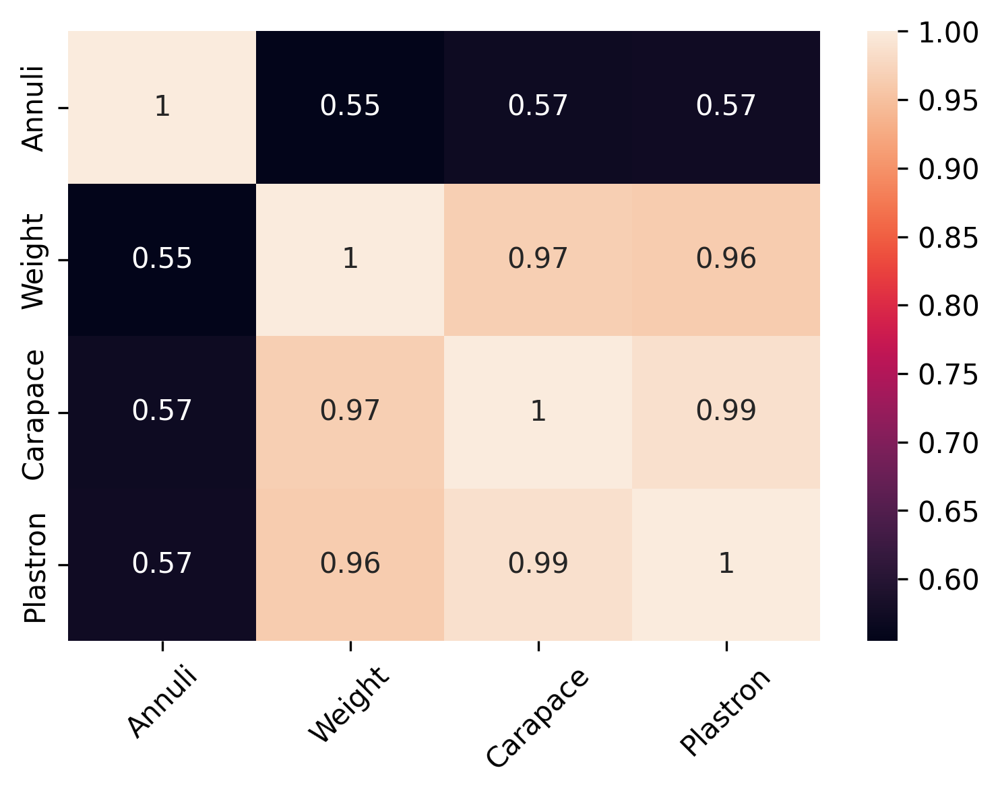

In [14]:
corrleations = native_males.loc[slice(None),['Annuli','Weight','Carapace','Plastron']].corr()

_ = sns.heatmap(corrleations,annot=True)
_ = plt.xticks(rotation=45)
_ = plt.show()


# Distribution of weights and sizes by sex, separating out gravid and non-gravid females
.

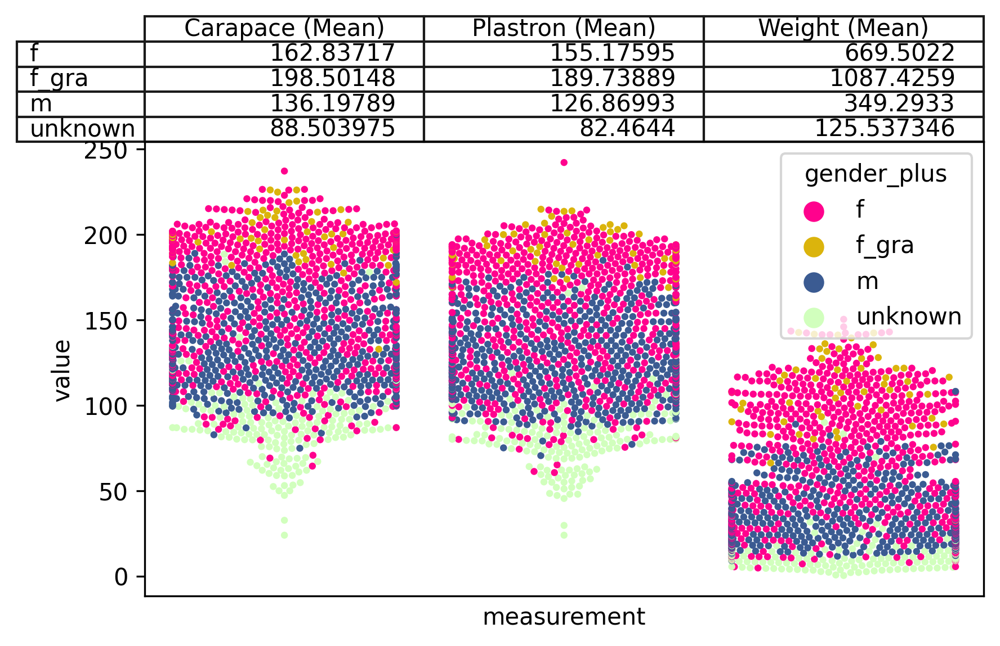

In [15]:
#
colors = {
    'f_spr': sns.xkcd_rgb['soft pink'],
    'f_fal': sns.xkcd_rgb['hot pink'],
    'f_gra': sns.xkcd_rgb['gold'],
    'm_spr': sns.xkcd_rgb['baby blue'],
    'm_fal': sns.xkcd_rgb['denim blue'],
    'unknown': sns.xkcd_rgb['very light green'],
    'f': sns.xkcd_rgb['hot pink'],
    'm': sns.xkcd_rgb['denim blue'],
}
natives_melted13 = natives.copy()
natives_melted13['Weight / 10'] = natives_melted13.Weight.div(10)
natives_melted13 = pd.melt(natives_melted13[['Carapace','Plastron','Weight / 10','gender_plus']],'gender_plus',var_name='measurement')

sns.swarmplot(x="measurement", y="value", hue="gender_plus", data=natives_melted13,palette=colors,size=3)


someColumns = [
    'Carapace',
    'Plastron',
    'Weight',
    'gender_plus'
]
stats_df = natives[someColumns].groupby('gender_plus').mean()

gender_stats_parms = {
    'cellText': stats_df.values,
    'rowLabels': stats_df.index.values,
    'colLabels': ["Carapace (Mean)","Plastron (Mean)","Weight (Mean)"],
    'loc': 'top',}
    
gender_stats = plt.table(**gender_stats_parms)
plt.xticks([])
plt.tight_layout(True)

_ = plt.show()


# Scatterplot graph showing the correlation of annuli with size/weights of animals by sex with gravid females separated from non-gravid females.
Same as above - showing the relationship between size/weight and age for gravid females, non-gravid females, males, and unknowns.  Can we include the averages on this graph too?

In [16]:
display("Mean values per gender and location")
someColumns = [
    'Carapace',
    'Plastron',
    'Weight',
    'gender_plus',
    'Capture Location',
]
stats_df = natives[natives['Gender']!='unknown'][someColumns].groupby(['gender_plus','Capture Location']).mean()
display(stats_df)

'Mean values per gender and location'

Carapace    Plastron       Weight
gender_plus Capture Location                                                
f           Backyard                     196.839996  188.980011   952.500000
            Binford Lake                 201.100006  193.029999  1250.000000
            Bybee Lake                   143.851349  135.689194   501.216217
            Center Channel               141.551666  135.622223   524.000000
            Center Channel - middle      150.366241  143.707504   545.625000
...                                             ...         ...          ...
m           east channel-center          150.149994  139.259995   426.000000
            mason flats NE3              121.516670  113.356667   244.333328
            mason flats center pond      152.060913  140.583633   454.181824
            mason flats west pond        123.129997  112.529999   241.000000
            west side of center channel  120.725006  113.654999   241.000000

[134 rows x 3 columns]

NEW ANNULI - Plotting scatter plot with hue  1240 samples...


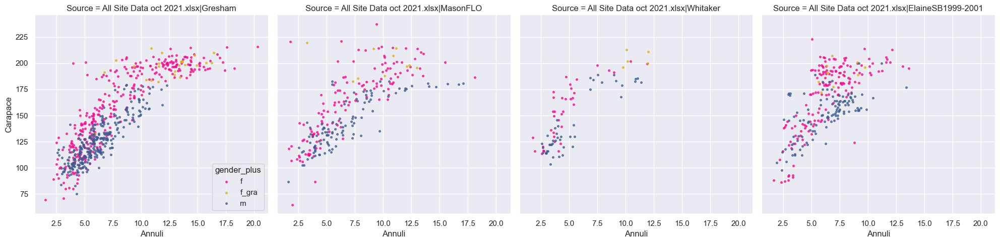

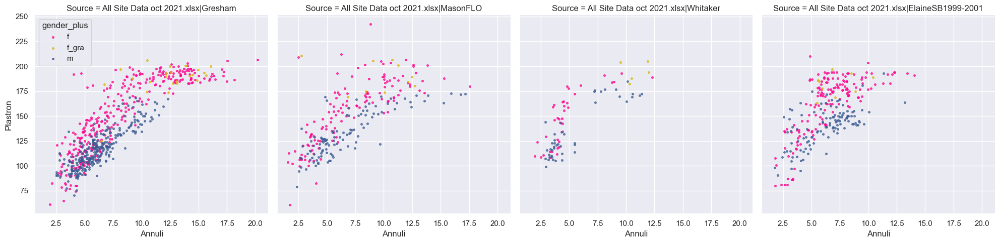

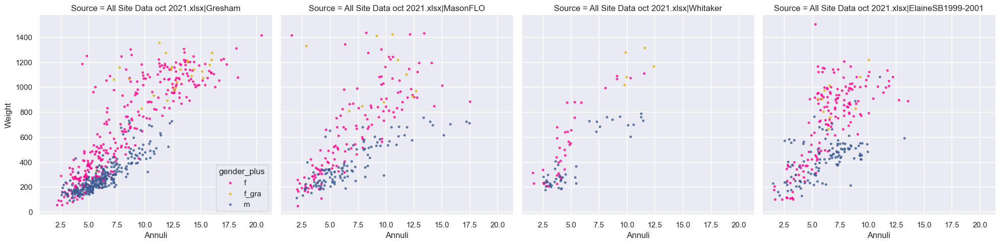

In [17]:


# scatterplot with linear digression 
#sns.set()
# import statsmodels
natives14 = natives[natives['Gender']!='unknown']
is_robust = False


### Swarmplot with Hue and Linear Digression 
natives14 = natives14[natives14['Annuli']!=0]
#colors = [sns.xkcd_rgb['pale red'],sns.xkcd_rgb['denim blue'],sns.xkcd_rgb['medium green']]
plt.rcParams['figure.dpi'] = 100
print ("NEW ANNULI - Plotting scatter plot with hue  " + str(natives14.Weight.count()) + ' samples...')
lmplotParams = {
    'x': 'Annuli', 
    'y': 'Carapace', 
    'hue': 'gender_plus',
    'col': "Source",
    'data': natives14,
    'palette': colors,
    'scatter': True,
    'fit_reg': False,
    'lowess': True,
    'legend_out': False,
    'x_jitter': .5,
    'y_jitter': .1,
    'scatter_kws': {"s": 7,"alpha": .7},
}
sns.set()
#lowess=True, too bus
_ = sns.lmplot(**lmplotParams)
_ = plt.ylabel('Carapace')
lmplotParams['y'] = 'Plastron'
_ = sns.lmplot(**lmplotParams)
_ = plt.ylabel('Plastron')
lmplotParams['y'] = 'Weight'
_ = sns.lmplot(**lmplotParams)
_ = plt.ylabel('Weight')



plt.tight_layout(True)



# Scatterplot showing the distribution of sizes and weights as a function of which season the female data was collected.
Same as the two graphs above.  Shows distribution of sizes and weights and separates females into three groups (non-gravid spring, gravid spring, and fall measurements) and males and unknowns.

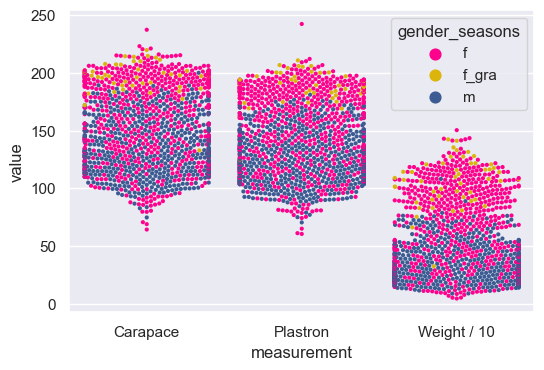

In [18]:
natives_melted15 = natives14.copy()
natives_melted15['Weight / 10'] = natives_melted15.Weight.div(10)
natives_melted15 = pd.melt(natives_melted15[['Carapace','Plastron','Weight / 10','gender_seasons']],'gender_seasons',var_name='measurement')

_ = sns.swarmplot(x="measurement", y="value", hue="gender_seasons", data=natives_melted15,palette=colors,size=3)
_ = plt.show()

# Comparison of size/weight distributions across seasons between Gresham and Mason Flats populations
Comparison of size/weight distributions by sex for animals caught in the spring vs. fall between two populations (Gresham and Mason Flats).

NEW ANNULI - Plotting scatter plot with hue  1240 samples...


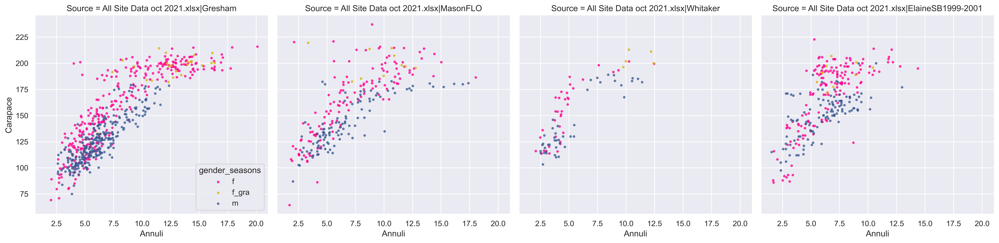

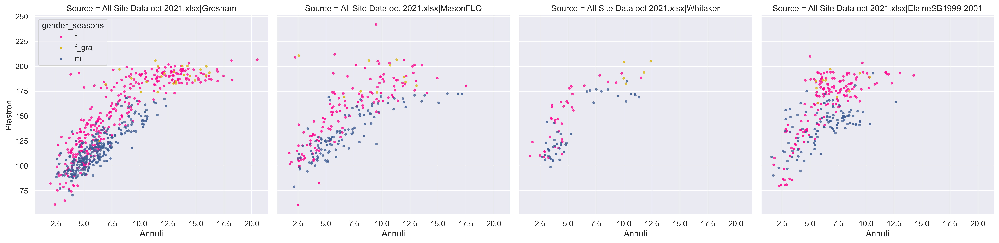

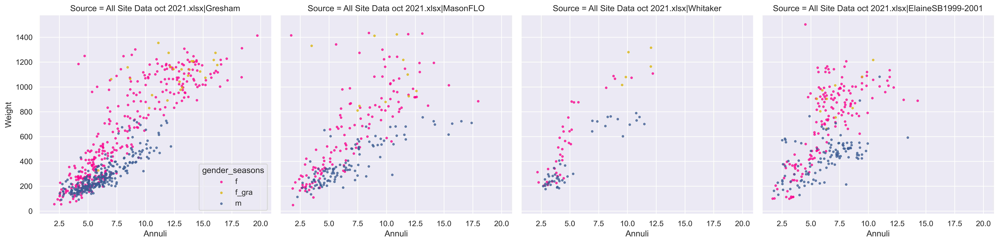

In [20]:
# import statsmodels
natives16 = natives14[natives14['Gender']!='unknown']
is_robust = False


### Swarmplot with Hue and Linear Digression 
natives16 = natives16[natives16['Annuli']!=0]
#colors = [sns.xkcd_rgb['pale red'],sns.xkcd_rgb['denim blue'],sns.xkcd_rgb['medium green']]
plt.rcParams['figure.dpi'] = 500
print ("NEW ANNULI - Plotting scatter plot with hue  " + str(natives16.Weight.count()) + ' samples...')
lmplotParams = {
    'x': 'Annuli', 
    'y': 'Carapace', 
    'hue': 'gender_seasons',
    'col': "Source",
    'data': natives16,
    'palette': colors,
    'scatter': True,
    'fit_reg': False,
    #'lowess': True,
    'legend_out': False,
    'x_jitter': .5,
    'y_jitter': .1,
    'scatter_kws': {"s": 7,"alpha": .7},
}
_ = sns.lmplot(**lmplotParams)
_ = plt.ylabel('Carapace')
lmplotParams['y'] = 'Plastron'
_ = sns.lmplot(**lmplotParams)
_ = plt.ylabel('Plastron')
lmplotParams['y'] = 'Weight'
_ = sns.lmplot(**lmplotParams)
_ = plt.ylabel('Weight')


# Comparison of size/weight distributions across seasons between Gresham and Mason Flats populations
Same as above graphs, but with higher-order polynomial regression lines.  Comparison of size/weight distributions by sex for animals caught in the spring vs. fall between two populations (Gresham and Mason Flats).  Males show no real difference in distribution between populations or seasons.  Females have a greater diversity of sizes/weights and are heavier in fall vs. spring, with gravid females being the heaviest on average.

/Users/kkopowski/.asdf/installs/python/3.8.12/lib/python3.8/site-packages/seaborn/regression.py:256: RankWarning: Polyfit may be poorly conditioned
  yhat = reg_func(x, y)


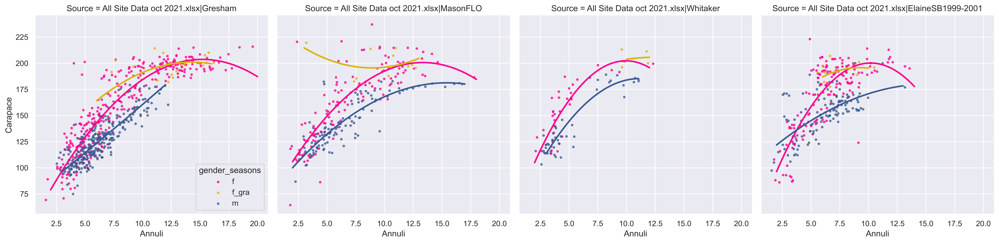

/Users/kkopowski/.asdf/installs/python/3.8.12/lib/python3.8/site-packages/seaborn/regression.py:256: RankWarning: Polyfit may be poorly conditioned
  yhat = reg_func(x, y)


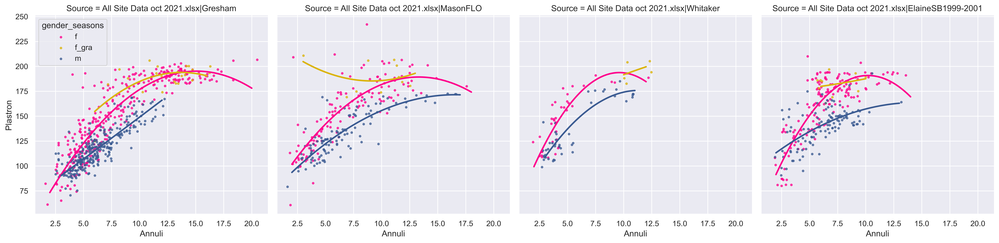

/Users/kkopowski/.asdf/installs/python/3.8.12/lib/python3.8/site-packages/seaborn/regression.py:256: RankWarning: Polyfit may be poorly conditioned
  yhat = reg_func(x, y)


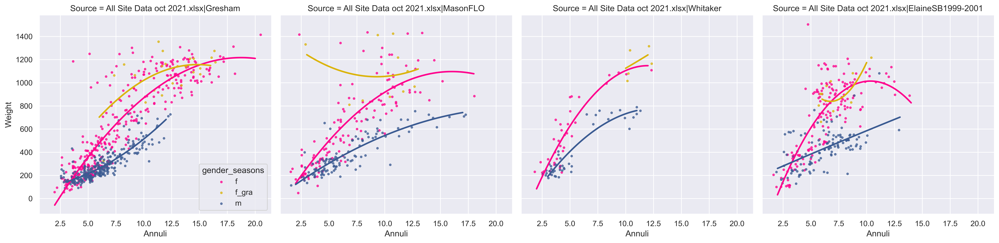

In [21]:
#lmplotParams['lowess'] = False
lmplotParams['order'] = 2
lmplotParams['ci'] = None
lmplotParams['fit_reg'] = True
lmplotParams['truncate'] = True

lmplotParams['y'] = 'Carapace'
_ = sns.lmplot(**lmplotParams)
_ = plt.ylabel('Carapace')
plt.show()
lmplotParams['y'] = 'Plastron'
_ = sns.lmplot(**lmplotParams)
_ = plt.ylabel('Plastron')
plt.show()
lmplotParams['y'] = 'Weight'
_ = sns.lmplot(**lmplotParams)
_ = plt.ylabel('Weight')
plt.show()